<a href="https://colab.research.google.com/github/Manjunatha-9611/CSE_142__PSCS_21-Application-Development-for-monitoring-of-wool-from-Farm-to-fabric/blob/main/Welcome_To_Colab.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
!pip install --upgrade diffusers transformers accelerate torch bitsandbytes scipy safetensors xformers

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 40.1/40.1 kB 2.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 62.0/62.0 kB 4.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 11.6/11.6 MB 119.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 61.3/61.3 MB 18.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 35.7/35.7 MB 17.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 117.2/117.2 MB 7.4 MB/s eta 0:00:00
  Attempting uninstall: scipy
    Found existing installation: scipy 1.16.1
    Uninstalling scipy-1.16.1:
      Successfully uninstalled scipy-1.16.1
  Attempting uninstall: transformers
    Found existing installation: transformers 4.56.1
    Uninstalling transformers-4.56.1:
      Successfully uninstalled transformers-4.56.1


/usr/local/lib/python3.12/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


model_index.json:   0%|          | 0.00/537 [00:00<?, ?B/s]

Fetching 13 files:   0%|          | 0/13 [00:00<?, ?it/s]

config.json:   0%|          | 0.00/633 [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/460 [00:00<?, ?B/s]

preprocessor_config.json:   0%|          | 0.00/342 [00:00<?, ?B/s]

scheduler_config.json:   0%|          | 0.00/345 [00:00<?, ?B/s]

merges.txt: 0.00B [00:00, ?B/s]

tokenizer_config.json:   0%|          | 0.00/824 [00:00<?, ?B/s]

vocab.json: 0.00B [00:00, ?B/s]

text_encoder/model.safetensors:   0%|          | 0.00/1.36G [00:00<?, ?B/s]

config.json:   0%|          | 0.00/939 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/611 [00:00<?, ?B/s]

vae/diffusion_pytorch_model.safetensors:   0%|          | 0.00/335M [00:00<?, ?B/s]

unet/diffusion_pytorch_model.safetensors:   0%|          | 0.00/3.46G [00:00<?, ?B/s]

Loading pipeline components...:   0%|          | 0/6 [00:00<?, ?it/s]

`torch_dtype` is deprecated! Use `dtype` instead!


  0%|          | 0/50 [00:00<?, ?it/s]

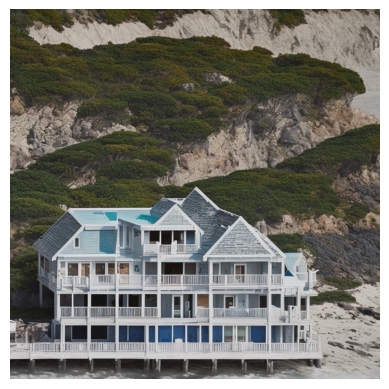

In [2]:
import torch
from diffusers import StableDiffusionPipeline, DPMSolverMultistepScheduler
import matplotlib.pyplot as plt

torch.cuda.empty_cache()
model_id = "stabilityai/stable-diffusion-2-1"

pipe = StableDiffusionPipeline.from_pretrained(model_id, torch_dtype=torch.float16)
pipe.scheduler = DPMSolverMultistepScheduler.from_config(pipe.scheduler.config)
pipe = pipe.to("cuda")

prompt = "a house in front of the ocean"
image = pipe(prompt, width=1000, height=1000).images[0]

plt.imshow(image)
plt.axis('off')  # Turn off axis numbers and ticks
plt.show()

In [3]:
import torch
from diffusers import StableDiffusionPipeline, DPMSolverMultistepScheduler
from tqdm import tqdm
import os
import matplotlib.pyplot as plt

# Clear GPU cache before starting. Good practice for systems with low VRAM.
torch.cuda.empty_cache()

# --- Stable Diffusion Model Setup ---
# You are using Stable Diffusion 2.1, which is a great choice.
# The model will be downloaded automatically the first time you run this.
# Note: You can also point to a local model path if you've already downloaded it.
model_id = "stabilityai/stable-diffusion-2-1"
pipe = StableDiffusionPipeline.from_pretrained(model_id, torch_dtype=torch.float16)

# Set the scheduler for faster generation.
pipe.scheduler = DPMSolverMultistepScheduler.from_config(pipe.scheduler.config)

# Send the model to your GPU.
# For 4GB VRAM, the flags `--xformers` and `--medvram` are essential.
# You add these in the `webui-user.bat` file, not in this script directly.
# The `pipe.enable_attention_slicing()` command here is an alternative
# to manage memory directly within the script.
pipe.enable_attention_slicing()
pipe = pipe.to("cuda")

# --- Dataset Generation Logic ---
# Create a directory to save the dataset
output_dir = "wool_dataset_stable_diffusion"
os.makedirs(output_dir, exist_ok=True)

# Define the lists of parameters for each wool quality attribute
wool_color_params = [
    "pure white", "off-white", "light cream", "fawn (light brown)",
    "mixed black and white", "dark grey", "deep black", "golden brown"
]

wool_length_params = [
    "very short staple (3-5 cm)", "short staple (6-8 cm)",
    "medium staple (9-12 cm)", "long staple (15-20 cm)"
]

wool_texture_params = [
    "soft with high crimp", "coarse and straight", "lustrous with medium crimp",
    "slightly matted and tangled"
]

contamination_params = [
    "no contamination", "light vegetable matter (seeds)", "heavy dirt and soil",
    "specks of synthetic fibers", "light rust stains"
]

# Function to generate images and save them
def generate_images_for_category(category_name, params, num_images, dataset_type="training"):
    print(f"Generating images for {dataset_type} {category_name}...")

    # Create a sub-directory for the specific category and dataset type (e.g., training/wool_color)
    category_dir = os.path.join(output_dir, dataset_type, category_name.lower().replace(" ", "_"))
    os.makedirs(category_dir, exist_ok=True)

    # Loop to generate the specified number of images
    for i in tqdm(range(num_images)):
        prompt_param = params[i % len(params)]

        # Construct the base prompt based on the category
        if category_name == "Wool Color":
            prompt = f"A photo of a pile of raw {prompt_param} wool."
        elif category_name == "Wool Length":
            prompt = f"A photo showing a sample of raw off-white wool with {prompt_param}."
        elif category_name == "Wool Texture":
            prompt = f"A close-up photo of raw light grey wool with a {prompt_param} texture."
        else: # Contamination
            prompt = f"A photo of a pile of raw, off-white wool with {prompt_param} and dirt."

        # Add a consistent style to every prompt for a uniform dataset feel
        prompt += " The image is taken with a mobile camera, has a slightly rustic feel, and is set against a simple farm background. Realistic photo, no artistic style. Indian setting."

        try:
            # Generate the image using the Stable Diffusion pipeline
            image = pipe(
                prompt,
                width=512,  # SD 2.1 is optimized for 512x512 or 768x768
                height=512,
                num_inference_steps=25  # A good number for the DPMSolverMultistepScheduler
            ).images[0]

            # Save the image to the appropriate folder
            filename = f"{category_name.lower().replace(' ', '_')}_{i+1:03d}.png"
            filepath = os.path.join(category_dir, filename)
            image.save(filepath)

        except Exception as e:
            print(f"An error occurred at image {i+1} in {category_name}: {e}")

# --- Set the number of images to generate for training and testing ---
num_training_images = 200
num_testing_images = 50

# Run the generation process for each category
print("Starting Training Dataset Generation...")
generate_images_for_category("Wool Color", wool_color_params, num_training_images, dataset_type="training")
generate_images_for_category("Wool Length", wool_length_params, num_training_images, dataset_type="training")
generate_images_for_category("Wool Texture", wool_texture_params, num_training_images, dataset_type="training")
generate_images_for_category("Contamination", contamination_params, num_training_images, dataset_type="training")

print("\nStarting Testing Dataset Generation...")
# You would use different prompts for testing to avoid data leakage
# For simplicity, we'll just run the same generation process again
# In a real-world scenario, you would have a separate `testing_prompts` list
generate_images_for_category("Wool Color", wool_color_params, num_testing_images, dataset_type="testing")
generate_images_for_category("Wool Length", wool_length_params, num_testing_images, dataset_type="testing")
generate_images_for_category("Wool Texture", wool_texture_params, num_testing_images, dataset_type="testing")
generate_images_for_category("Contamination", contamination_params, num_testing_images, dataset_type="testing")

print("\nDataset generation complete!")

Loading pipeline components...:   0%|          | 0/6 [00:00<?, ?it/s]

Starting Training Dataset Generation...
Generating images for training Wool Color...


  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 1/200 [00:06<21:55,  6.61s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

  1%|          | 2/200 [00:13<21:44,  6.59s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

  2%|▏         | 3/200 [00:19<20:30,  6.25s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

  2%|▏         | 4/200 [00:24<19:48,  6.06s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

  2%|▎         | 5/200 [00:30<19:23,  5.97s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

  3%|▎         | 6/200 [00:36<19:10,  5.93s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

  4%|▎         | 7/200 [00:42<19:00,  5.91s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

  4%|▍         | 8/200 [00:48<18:55,  5.91s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

  4%|▍         | 9/200 [00:54<18:52,  5.93s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

  5%|▌         | 10/200 [01:00<18:52,  5.96s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

  6%|▌         | 11/200 [01:06<18:51,  5.99s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

  6%|▌         | 12/200 [01:12<18:46,  5.99s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

  6%|▋         | 13/200 [01:18<18:43,  6.01s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

  7%|▋         | 14/200 [01:24<18:37,  6.01s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

  8%|▊         | 15/200 [01:30<18:30,  6.01s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

  8%|▊         | 16/200 [01:36<18:23,  6.00s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

  8%|▊         | 17/200 [01:42<18:13,  5.98s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

  9%|▉         | 18/200 [01:48<18:05,  5.97s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 10%|▉         | 19/200 [01:54<17:58,  5.96s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 10%|█         | 20/200 [02:00<17:49,  5.94s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 10%|█         | 21/200 [02:05<17:40,  5.93s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 11%|█         | 22/200 [02:11<17:32,  5.91s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 12%|█▏        | 23/200 [02:17<17:25,  5.91s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 12%|█▏        | 24/200 [02:23<17:19,  5.90s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 12%|█▎        | 25/200 [02:29<17:15,  5.92s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 13%|█▎        | 26/200 [02:35<17:10,  5.92s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 14%|█▎        | 27/200 [02:41<17:07,  5.94s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 14%|█▍        | 28/200 [02:47<17:02,  5.94s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 14%|█▍        | 29/200 [02:53<16:57,  5.95s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 15%|█▌        | 30/200 [02:59<16:51,  5.95s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 16%|█▌        | 31/200 [03:05<16:45,  5.95s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 16%|█▌        | 32/200 [03:11<16:38,  5.94s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 16%|█▋        | 33/200 [03:17<16:30,  5.93s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 17%|█▋        | 34/200 [03:23<16:26,  5.94s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 18%|█▊        | 35/200 [03:29<16:19,  5.94s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 18%|█▊        | 36/200 [03:34<16:14,  5.94s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 18%|█▊        | 37/200 [03:40<16:08,  5.94s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 19%|█▉        | 38/200 [03:46<16:02,  5.94s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 20%|█▉        | 39/200 [03:52<15:56,  5.94s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 20%|██        | 40/200 [03:58<15:48,  5.93s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 20%|██        | 41/200 [04:04<15:42,  5.93s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 21%|██        | 42/200 [04:10<15:36,  5.93s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 22%|██▏       | 43/200 [04:16<15:29,  5.92s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 22%|██▏       | 44/200 [04:22<15:24,  5.92s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 22%|██▎       | 45/200 [04:28<15:18,  5.93s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 23%|██▎       | 46/200 [04:34<15:12,  5.93s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 24%|██▎       | 47/200 [04:40<15:08,  5.93s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 24%|██▍       | 48/200 [04:46<15:01,  5.93s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 24%|██▍       | 49/200 [04:52<14:54,  5.92s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 25%|██▌       | 50/200 [04:57<14:47,  5.92s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 26%|██▌       | 51/200 [05:03<14:43,  5.93s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 26%|██▌       | 52/200 [05:09<14:38,  5.94s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 26%|██▋       | 53/200 [05:15<14:33,  5.95s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 27%|██▋       | 54/200 [05:21<14:28,  5.95s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 28%|██▊       | 55/200 [05:27<14:23,  5.95s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 28%|██▊       | 56/200 [05:33<14:16,  5.95s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 28%|██▊       | 57/200 [05:39<14:11,  5.95s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 29%|██▉       | 58/200 [05:45<14:05,  5.95s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 30%|██▉       | 59/200 [05:51<14:00,  5.96s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 30%|███       | 60/200 [05:57<13:55,  5.96s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 30%|███       | 61/200 [06:03<13:48,  5.96s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 31%|███       | 62/200 [06:09<13:42,  5.96s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 32%|███▏      | 63/200 [06:15<13:36,  5.96s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 32%|███▏      | 64/200 [06:21<13:31,  5.97s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 32%|███▎      | 65/200 [06:27<13:27,  5.98s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 33%|███▎      | 66/200 [06:33<13:21,  5.98s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 34%|███▎      | 67/200 [06:39<13:16,  5.99s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 34%|███▍      | 68/200 [06:45<13:09,  5.98s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 34%|███▍      | 69/200 [06:51<13:03,  5.98s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 35%|███▌      | 70/200 [06:57<12:57,  5.98s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 36%|███▌      | 71/200 [07:03<12:51,  5.98s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 36%|███▌      | 72/200 [07:09<12:44,  5.97s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 36%|███▋      | 73/200 [07:15<12:39,  5.98s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 37%|███▋      | 74/200 [07:21<12:34,  5.99s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 38%|███▊      | 75/200 [07:27<12:27,  5.98s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 38%|███▊      | 76/200 [07:33<12:21,  5.98s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 38%|███▊      | 77/200 [07:39<12:15,  5.98s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 39%|███▉      | 78/200 [07:45<12:09,  5.98s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 40%|███▉      | 79/200 [07:51<12:02,  5.97s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 40%|████      | 80/200 [07:57<11:55,  5.97s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 40%|████      | 81/200 [08:02<11:49,  5.96s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 41%|████      | 82/200 [08:08<11:43,  5.96s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 42%|████▏     | 83/200 [08:14<11:38,  5.97s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 42%|████▏     | 84/200 [08:20<11:31,  5.97s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 42%|████▎     | 85/200 [08:26<11:25,  5.96s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 43%|████▎     | 86/200 [08:32<11:18,  5.95s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 44%|████▎     | 87/200 [08:38<11:12,  5.95s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 44%|████▍     | 88/200 [08:44<11:05,  5.95s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 44%|████▍     | 89/200 [08:50<11:01,  5.96s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 45%|████▌     | 90/200 [08:56<10:54,  5.95s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 46%|████▌     | 91/200 [09:02<10:49,  5.95s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 46%|████▌     | 92/200 [09:08<10:43,  5.95s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 46%|████▋     | 93/200 [09:14<10:37,  5.96s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 47%|████▋     | 94/200 [09:20<10:31,  5.96s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 48%|████▊     | 95/200 [09:26<10:25,  5.96s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 48%|████▊     | 96/200 [09:32<10:18,  5.95s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 48%|████▊     | 97/200 [09:38<10:13,  5.95s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 49%|████▉     | 98/200 [09:44<10:06,  5.95s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 50%|████▉     | 99/200 [09:50<10:01,  5.95s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 50%|█████     | 100/200 [09:56<09:54,  5.95s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 50%|█████     | 101/200 [10:02<09:47,  5.94s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 51%|█████     | 102/200 [10:07<09:42,  5.94s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 52%|█████▏    | 103/200 [10:13<09:37,  5.96s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 52%|█████▏    | 104/200 [10:19<09:31,  5.95s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 52%|█████▎    | 105/200 [10:25<09:25,  5.95s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 53%|█████▎    | 106/200 [10:31<09:18,  5.95s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 54%|█████▎    | 107/200 [10:37<09:13,  5.96s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 54%|█████▍    | 108/200 [10:43<09:07,  5.95s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 55%|█████▍    | 109/200 [10:49<09:02,  5.96s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 55%|█████▌    | 110/200 [10:55<08:55,  5.95s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 56%|█████▌    | 111/200 [11:01<08:48,  5.94s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 56%|█████▌    | 112/200 [11:07<08:42,  5.94s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 56%|█████▋    | 113/200 [11:13<08:36,  5.94s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 57%|█████▋    | 114/200 [11:19<08:30,  5.94s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 57%|█████▊    | 115/200 [11:25<08:24,  5.94s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 58%|█████▊    | 116/200 [11:31<08:18,  5.94s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 58%|█████▊    | 117/200 [11:37<08:12,  5.93s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 59%|█████▉    | 118/200 [11:43<08:06,  5.93s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 60%|█████▉    | 119/200 [11:49<08:01,  5.94s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 60%|██████    | 120/200 [11:54<07:54,  5.94s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 60%|██████    | 121/200 [12:00<07:49,  5.95s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 61%|██████    | 122/200 [12:06<07:43,  5.94s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 62%|██████▏   | 123/200 [12:12<07:37,  5.94s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 62%|██████▏   | 124/200 [12:18<07:31,  5.94s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 62%|██████▎   | 125/200 [12:24<07:25,  5.94s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 63%|██████▎   | 126/200 [12:30<07:19,  5.94s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 64%|██████▎   | 127/200 [12:36<07:14,  5.95s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 64%|██████▍   | 128/200 [12:42<07:07,  5.94s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 64%|██████▍   | 129/200 [12:48<07:02,  5.95s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 65%|██████▌   | 130/200 [12:54<06:57,  5.96s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 66%|██████▌   | 131/200 [13:00<06:50,  5.95s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 66%|██████▌   | 132/200 [13:06<06:44,  5.95s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 66%|██████▋   | 133/200 [13:12<06:38,  5.95s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 67%|██████▋   | 134/200 [13:18<06:33,  5.96s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 68%|██████▊   | 135/200 [13:24<06:27,  5.97s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 68%|██████▊   | 136/200 [13:30<06:21,  5.96s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 68%|██████▊   | 137/200 [13:36<06:16,  5.97s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 69%|██████▉   | 138/200 [13:42<06:10,  5.98s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 70%|██████▉   | 139/200 [13:48<06:04,  5.98s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 70%|███████   | 140/200 [13:54<05:58,  5.98s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 70%|███████   | 141/200 [14:00<05:52,  5.98s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 71%|███████   | 142/200 [14:06<05:47,  5.98s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 72%|███████▏  | 143/200 [14:12<05:40,  5.97s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 72%|███████▏  | 144/200 [14:18<05:34,  5.96s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 72%|███████▎  | 145/200 [14:23<05:28,  5.97s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 73%|███████▎  | 146/200 [14:29<05:22,  5.97s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 74%|███████▎  | 147/200 [14:35<05:16,  5.97s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 74%|███████▍  | 148/200 [14:41<05:10,  5.97s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 74%|███████▍  | 149/200 [14:47<05:04,  5.98s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 75%|███████▌  | 150/200 [14:53<04:58,  5.97s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 76%|███████▌  | 151/200 [14:59<04:52,  5.97s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 76%|███████▌  | 152/200 [15:05<04:45,  5.95s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 76%|███████▋  | 153/200 [15:11<04:39,  5.96s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 77%|███████▋  | 154/200 [15:17<04:34,  5.96s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 78%|███████▊  | 155/200 [15:23<04:28,  5.96s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 78%|███████▊  | 156/200 [15:29<04:22,  5.96s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 78%|███████▊  | 157/200 [15:35<04:15,  5.95s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 79%|███████▉  | 158/200 [15:41<04:09,  5.94s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 80%|███████▉  | 159/200 [15:47<04:03,  5.94s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 80%|████████  | 160/200 [15:53<03:57,  5.95s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 80%|████████  | 161/200 [15:59<03:51,  5.94s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 81%|████████  | 162/200 [16:05<03:45,  5.94s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 82%|████████▏ | 163/200 [16:11<03:39,  5.94s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 82%|████████▏ | 164/200 [16:17<03:33,  5.94s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 82%|████████▎ | 165/200 [16:23<03:28,  5.95s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 83%|████████▎ | 166/200 [16:28<03:21,  5.94s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 84%|████████▎ | 167/200 [16:34<03:15,  5.93s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 84%|████████▍ | 168/200 [16:40<03:10,  5.94s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 84%|████████▍ | 169/200 [16:46<03:04,  5.94s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 85%|████████▌ | 170/200 [16:52<02:58,  5.96s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 86%|████████▌ | 171/200 [16:58<02:52,  5.96s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 86%|████████▌ | 172/200 [17:04<02:46,  5.96s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 86%|████████▋ | 173/200 [17:10<02:40,  5.95s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 87%|████████▋ | 174/200 [17:16<02:34,  5.96s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 88%|████████▊ | 175/200 [17:22<02:28,  5.95s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 88%|████████▊ | 176/200 [17:28<02:22,  5.95s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 88%|████████▊ | 177/200 [17:34<02:17,  5.96s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 89%|████████▉ | 178/200 [17:40<02:10,  5.95s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 90%|████████▉ | 179/200 [17:46<02:04,  5.95s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 90%|█████████ | 180/200 [17:52<01:58,  5.95s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 90%|█████████ | 181/200 [17:58<01:53,  5.95s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 91%|█████████ | 182/200 [18:04<01:46,  5.94s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 92%|█████████▏| 183/200 [18:10<01:41,  5.95s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 92%|█████████▏| 184/200 [18:16<01:35,  5.95s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 92%|█████████▎| 185/200 [18:22<01:29,  5.96s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 93%|█████████▎| 186/200 [18:27<01:23,  5.95s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 94%|█████████▎| 187/200 [18:33<01:17,  5.96s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 94%|█████████▍| 188/200 [18:39<01:11,  5.95s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 94%|█████████▍| 189/200 [18:45<01:05,  5.96s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 95%|█████████▌| 190/200 [18:51<00:59,  5.95s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 96%|█████████▌| 191/200 [18:57<00:53,  5.95s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 96%|█████████▌| 192/200 [19:03<00:47,  5.95s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 96%|█████████▋| 193/200 [19:09<00:41,  5.96s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 97%|█████████▋| 194/200 [19:15<00:35,  5.95s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 98%|█████████▊| 195/200 [19:21<00:29,  5.97s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 98%|█████████▊| 196/200 [19:27<00:23,  5.97s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 98%|█████████▊| 197/200 [19:33<00:17,  5.98s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 99%|█████████▉| 198/200 [19:39<00:11,  5.97s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

100%|█████████▉| 199/200 [19:45<00:05,  5.98s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

100%|██████████| 200/200 [19:51<00:00,  5.96s/it]


Generating images for training Wool Length...


  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 1/200 [00:05<19:44,  5.95s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

  1%|          | 2/200 [00:11<19:41,  5.97s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

  2%|▏         | 3/200 [00:17<19:36,  5.97s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

  2%|▏         | 4/200 [00:23<19:35,  6.00s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

  2%|▎         | 5/200 [00:29<19:27,  5.99s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

  3%|▎         | 6/200 [00:35<19:19,  5.98s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

  4%|▎         | 7/200 [00:41<19:12,  5.97s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

  4%|▍         | 8/200 [00:47<19:04,  5.96s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

  4%|▍         | 9/200 [00:53<18:59,  5.96s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

  5%|▌         | 10/200 [00:59<18:53,  5.96s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

  6%|▌         | 11/200 [01:05<18:45,  5.96s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

  6%|▌         | 12/200 [01:11<18:40,  5.96s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

  6%|▋         | 13/200 [01:17<18:36,  5.97s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

  7%|▋         | 14/200 [01:23<18:27,  5.96s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

  8%|▊         | 15/200 [01:29<18:21,  5.95s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

  8%|▊         | 16/200 [01:35<18:17,  5.97s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

  8%|▊         | 17/200 [01:41<18:11,  5.97s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

  9%|▉         | 18/200 [01:47<18:05,  5.96s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 10%|▉         | 19/200 [01:53<17:58,  5.96s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 10%|█         | 20/200 [01:59<17:51,  5.96s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 10%|█         | 21/200 [02:05<17:45,  5.95s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 11%|█         | 22/200 [02:11<17:38,  5.95s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 12%|█▏        | 23/200 [02:17<17:30,  5.93s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 12%|█▏        | 24/200 [02:23<17:25,  5.94s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 12%|█▎        | 25/200 [02:28<17:20,  5.95s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 13%|█▎        | 26/200 [02:34<17:14,  5.95s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 14%|█▎        | 27/200 [02:40<17:07,  5.94s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 14%|█▍        | 28/200 [02:46<17:02,  5.94s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 14%|█▍        | 29/200 [02:52<16:56,  5.94s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 15%|█▌        | 30/200 [02:58<16:51,  5.95s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 16%|█▌        | 31/200 [03:04<16:44,  5.94s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 16%|█▌        | 32/200 [03:10<16:38,  5.94s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 16%|█▋        | 33/200 [03:16<16:33,  5.95s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 17%|█▋        | 34/200 [03:22<16:27,  5.95s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 18%|█▊        | 35/200 [03:28<16:21,  5.95s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 18%|█▊        | 36/200 [03:34<16:16,  5.96s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 18%|█▊        | 37/200 [03:40<16:09,  5.95s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 19%|█▉        | 38/200 [03:46<16:02,  5.94s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 20%|█▉        | 39/200 [03:52<15:56,  5.94s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 20%|██        | 40/200 [03:58<15:49,  5.94s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 20%|██        | 41/200 [04:04<15:43,  5.93s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 21%|██        | 42/200 [04:09<15:37,  5.93s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 22%|██▏       | 43/200 [04:15<15:30,  5.93s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 22%|██▏       | 44/200 [04:21<15:26,  5.94s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 22%|██▎       | 45/200 [04:27<15:20,  5.94s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 23%|██▎       | 46/200 [04:33<15:13,  5.93s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 24%|██▎       | 47/200 [04:39<15:07,  5.93s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 24%|██▍       | 48/200 [04:45<15:01,  5.93s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 24%|██▍       | 49/200 [04:51<14:55,  5.93s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 25%|██▌       | 50/200 [04:57<14:50,  5.94s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 26%|██▌       | 51/200 [05:03<14:46,  5.95s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 26%|██▌       | 52/200 [05:09<14:39,  5.94s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 26%|██▋       | 53/200 [05:15<14:35,  5.96s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 27%|██▋       | 54/200 [05:21<14:30,  5.96s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 28%|██▊       | 55/200 [05:27<14:24,  5.96s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 28%|██▊       | 56/200 [05:33<14:18,  5.96s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 28%|██▊       | 57/200 [05:39<14:11,  5.95s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 29%|██▉       | 58/200 [05:45<14:04,  5.94s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 30%|██▉       | 59/200 [05:51<13:57,  5.94s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 30%|███       | 60/200 [05:57<13:53,  5.95s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 30%|███       | 61/200 [06:03<13:48,  5.96s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 31%|███       | 62/200 [06:08<13:41,  5.95s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 32%|███▏      | 63/200 [06:14<13:35,  5.95s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 32%|███▏      | 64/200 [06:20<13:29,  5.95s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 32%|███▎      | 65/200 [06:26<13:23,  5.95s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 33%|███▎      | 66/200 [06:32<13:17,  5.95s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 34%|███▎      | 67/200 [06:38<13:12,  5.96s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 34%|███▍      | 68/200 [06:44<13:05,  5.95s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 34%|███▍      | 69/200 [06:50<12:58,  5.95s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 35%|███▌      | 70/200 [06:56<12:51,  5.94s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 36%|███▌      | 71/200 [07:02<12:44,  5.93s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 36%|███▌      | 72/200 [07:08<12:38,  5.92s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 36%|███▋      | 73/200 [07:14<12:33,  5.94s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 37%|███▋      | 74/200 [07:20<12:27,  5.93s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 38%|███▊      | 75/200 [07:26<12:22,  5.94s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 38%|███▊      | 76/200 [07:32<12:15,  5.93s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 38%|███▊      | 77/200 [07:38<12:10,  5.94s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 39%|███▉      | 78/200 [07:43<12:04,  5.94s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 40%|███▉      | 79/200 [07:49<11:58,  5.94s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 40%|████      | 80/200 [07:55<11:52,  5.94s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 40%|████      | 81/200 [08:01<11:45,  5.93s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 41%|████      | 82/200 [08:07<11:39,  5.93s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 42%|████▏     | 83/200 [08:13<11:32,  5.92s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 42%|████▏     | 84/200 [08:19<11:28,  5.94s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 42%|████▎     | 85/200 [08:25<11:22,  5.94s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 43%|████▎     | 86/200 [08:31<11:15,  5.93s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 44%|████▎     | 87/200 [08:37<11:10,  5.94s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 44%|████▍     | 88/200 [08:43<11:05,  5.94s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 44%|████▍     | 89/200 [08:49<10:58,  5.93s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 45%|████▌     | 90/200 [08:55<10:52,  5.94s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 46%|████▌     | 91/200 [09:01<10:48,  5.95s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 46%|████▌     | 92/200 [09:07<10:41,  5.94s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 46%|████▋     | 93/200 [09:13<10:35,  5.94s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 47%|████▋     | 94/200 [09:18<10:29,  5.94s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 48%|████▊     | 95/200 [09:24<10:23,  5.94s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 48%|████▊     | 96/200 [09:30<10:16,  5.93s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 48%|████▊     | 97/200 [09:36<10:11,  5.94s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 49%|████▉     | 98/200 [09:42<10:06,  5.95s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 50%|████▉     | 99/200 [09:48<10:01,  5.96s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 50%|█████     | 100/200 [09:54<09:54,  5.95s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 50%|█████     | 101/200 [10:00<09:50,  5.96s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 51%|█████     | 102/200 [10:06<09:44,  5.96s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 52%|█████▏    | 103/200 [10:12<09:38,  5.96s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 52%|█████▏    | 104/200 [10:18<09:32,  5.96s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 52%|█████▎    | 105/200 [10:24<09:27,  5.97s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 53%|█████▎    | 106/200 [10:30<09:20,  5.96s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 54%|█████▎    | 107/200 [10:36<09:14,  5.97s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 54%|█████▍    | 108/200 [10:42<09:08,  5.96s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 55%|█████▍    | 109/200 [10:48<09:02,  5.96s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 55%|█████▌    | 110/200 [10:54<08:57,  5.97s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 56%|█████▌    | 111/200 [11:00<08:50,  5.96s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 56%|█████▌    | 112/200 [11:06<08:43,  5.95s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 56%|█████▋    | 113/200 [11:12<08:37,  5.95s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 57%|█████▋    | 114/200 [11:18<08:32,  5.96s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 57%|█████▊    | 115/200 [11:24<08:27,  5.98s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 58%|█████▊    | 116/200 [11:30<08:21,  5.96s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 58%|█████▊    | 117/200 [11:35<08:14,  5.96s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 59%|█████▉    | 118/200 [11:41<08:08,  5.96s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 60%|█████▉    | 119/200 [11:47<08:01,  5.95s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 60%|██████    | 120/200 [11:53<07:56,  5.95s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 60%|██████    | 121/200 [11:59<07:49,  5.95s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 61%|██████    | 122/200 [12:05<07:43,  5.94s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 62%|██████▏   | 123/200 [12:11<07:37,  5.94s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 62%|██████▏   | 124/200 [12:17<07:30,  5.93s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 62%|██████▎   | 125/200 [12:23<07:24,  5.93s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 63%|██████▎   | 126/200 [12:29<07:18,  5.93s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 64%|██████▎   | 127/200 [12:35<07:13,  5.94s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 64%|██████▍   | 128/200 [12:41<07:08,  5.95s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 64%|██████▍   | 129/200 [12:47<07:02,  5.95s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 65%|██████▌   | 130/200 [12:53<06:56,  5.95s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 66%|██████▌   | 131/200 [12:59<06:50,  5.95s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 66%|██████▌   | 132/200 [13:05<06:44,  5.95s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 66%|██████▋   | 133/200 [13:11<06:38,  5.95s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 67%|██████▋   | 134/200 [13:17<06:32,  5.94s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 68%|██████▊   | 135/200 [13:22<06:25,  5.93s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 68%|██████▊   | 136/200 [13:28<06:19,  5.93s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 68%|██████▊   | 137/200 [13:34<06:13,  5.93s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 69%|██████▉   | 138/200 [13:40<06:08,  5.94s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 70%|██████▉   | 139/200 [13:46<06:01,  5.93s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 70%|███████   | 140/200 [13:52<05:56,  5.94s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 70%|███████   | 141/200 [13:58<05:50,  5.93s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 71%|███████   | 142/200 [14:04<05:44,  5.94s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 72%|███████▏  | 143/200 [14:10<05:38,  5.93s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 72%|███████▏  | 144/200 [14:16<05:32,  5.94s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 72%|███████▎  | 145/200 [14:22<05:26,  5.94s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 73%|███████▎  | 146/200 [14:28<05:21,  5.95s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 74%|███████▎  | 147/200 [14:34<05:15,  5.95s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 74%|███████▍  | 148/200 [14:40<05:09,  5.95s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 74%|███████▍  | 149/200 [14:46<05:03,  5.95s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 75%|███████▌  | 150/200 [14:52<04:57,  5.95s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 76%|███████▌  | 151/200 [14:58<04:51,  5.95s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 76%|███████▌  | 152/200 [15:03<04:45,  5.95s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 76%|███████▋  | 153/200 [15:09<04:39,  5.94s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 77%|███████▋  | 154/200 [15:15<04:33,  5.95s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 78%|███████▊  | 155/200 [15:21<04:28,  5.96s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 78%|███████▊  | 156/200 [15:27<04:22,  5.96s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 78%|███████▊  | 157/200 [15:33<04:16,  5.96s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 79%|███████▉  | 158/200 [15:39<04:09,  5.94s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 80%|███████▉  | 159/200 [15:45<04:03,  5.94s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 80%|████████  | 160/200 [15:51<03:57,  5.94s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 80%|████████  | 161/200 [15:57<03:51,  5.93s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 81%|████████  | 162/200 [16:03<03:45,  5.93s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 82%|████████▏ | 163/200 [16:09<03:39,  5.92s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 82%|████████▏ | 164/200 [16:15<03:33,  5.93s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 82%|████████▎ | 165/200 [16:21<03:27,  5.93s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 83%|████████▎ | 166/200 [16:27<03:22,  5.94s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 84%|████████▎ | 167/200 [16:33<03:16,  5.95s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 84%|████████▍ | 168/200 [16:39<03:10,  5.95s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 84%|████████▍ | 169/200 [16:45<03:04,  5.95s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 85%|████████▌ | 170/200 [16:50<02:58,  5.95s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 86%|████████▌ | 171/200 [16:56<02:52,  5.95s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 86%|████████▌ | 172/200 [17:02<02:46,  5.95s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 86%|████████▋ | 173/200 [17:08<02:40,  5.95s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 87%|████████▋ | 174/200 [17:14<02:34,  5.96s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 88%|████████▊ | 175/200 [17:20<02:28,  5.96s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 88%|████████▊ | 176/200 [17:26<02:22,  5.94s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 88%|████████▊ | 177/200 [17:32<02:16,  5.95s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 89%|████████▉ | 178/200 [17:38<02:10,  5.94s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 90%|████████▉ | 179/200 [17:44<02:04,  5.92s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 90%|█████████ | 180/200 [17:50<01:58,  5.92s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 90%|█████████ | 181/200 [17:56<01:52,  5.93s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 91%|█████████ | 182/200 [18:02<01:46,  5.94s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 92%|█████████▏| 183/200 [18:08<01:41,  5.95s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 92%|█████████▏| 184/200 [18:14<01:35,  5.95s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 92%|█████████▎| 185/200 [18:20<01:29,  5.96s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 93%|█████████▎| 186/200 [18:26<01:23,  5.96s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 94%|█████████▎| 187/200 [18:32<01:17,  5.96s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 94%|█████████▍| 188/200 [18:37<01:11,  5.95s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 94%|█████████▍| 189/200 [18:43<01:05,  5.95s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 95%|█████████▌| 190/200 [18:49<00:59,  5.95s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 96%|█████████▌| 191/200 [18:55<00:53,  5.95s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 96%|█████████▌| 192/200 [19:01<00:47,  5.94s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 96%|█████████▋| 193/200 [19:07<00:41,  5.95s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 97%|█████████▋| 194/200 [19:13<00:35,  5.94s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 98%|█████████▊| 195/200 [19:19<00:29,  5.94s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 98%|█████████▊| 196/200 [19:25<00:23,  5.95s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 98%|█████████▊| 197/200 [19:31<00:17,  5.95s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 99%|█████████▉| 198/200 [19:37<00:11,  5.93s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

100%|█████████▉| 199/200 [19:43<00:05,  5.94s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

100%|██████████| 200/200 [19:49<00:00,  5.95s/it]


Generating images for training Wool Texture...


  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 1/200 [00:05<19:47,  5.97s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

  1%|          | 2/200 [00:11<19:40,  5.96s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

  2%|▏         | 3/200 [00:17<19:33,  5.96s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

  2%|▏         | 4/200 [00:23<19:28,  5.96s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

  2%|▎         | 5/200 [00:29<19:21,  5.96s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

  3%|▎         | 6/200 [00:35<19:15,  5.96s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

  4%|▎         | 7/200 [00:41<19:09,  5.96s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

  4%|▍         | 8/200 [00:47<19:02,  5.95s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

  4%|▍         | 9/200 [00:53<18:57,  5.96s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

  5%|▌         | 10/200 [00:59<18:50,  5.95s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

  6%|▌         | 11/200 [01:05<18:43,  5.95s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

  6%|▌         | 12/200 [01:11<18:36,  5.94s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

  6%|▋         | 13/200 [01:17<18:29,  5.93s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

  7%|▋         | 14/200 [01:23<18:23,  5.93s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

  8%|▊         | 15/200 [01:29<18:18,  5.94s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

  8%|▊         | 16/200 [01:35<18:13,  5.94s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

  8%|▊         | 17/200 [01:41<18:07,  5.94s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

  9%|▉         | 18/200 [01:47<18:03,  5.95s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 10%|▉         | 19/200 [01:53<18:00,  5.97s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 10%|█         | 20/200 [01:59<17:54,  5.97s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 10%|█         | 21/200 [02:04<17:44,  5.95s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 11%|█         | 22/200 [02:10<17:37,  5.94s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 12%|█▏        | 23/200 [02:16<17:32,  5.94s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 12%|█▏        | 24/200 [02:22<17:25,  5.94s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 12%|█▎        | 25/200 [02:28<17:21,  5.95s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 13%|█▎        | 26/200 [02:34<17:15,  5.95s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 14%|█▎        | 27/200 [02:40<17:07,  5.94s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 14%|█▍        | 28/200 [02:46<17:04,  5.95s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 14%|█▍        | 29/200 [02:52<16:59,  5.96s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 15%|█▌        | 30/200 [02:58<16:53,  5.96s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 16%|█▌        | 31/200 [03:04<16:47,  5.96s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 16%|█▌        | 32/200 [03:10<16:41,  5.96s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 16%|█▋        | 33/200 [03:16<16:36,  5.97s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 17%|█▋        | 34/200 [03:22<16:31,  5.97s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 18%|█▊        | 35/200 [03:28<16:25,  5.98s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 18%|█▊        | 36/200 [03:34<16:20,  5.98s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 18%|█▊        | 37/200 [03:40<16:15,  5.98s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 19%|█▉        | 38/200 [03:46<16:07,  5.97s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 20%|█▉        | 39/200 [03:52<16:01,  5.97s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 20%|██        | 40/200 [03:58<15:55,  5.97s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 20%|██        | 41/200 [04:04<15:47,  5.96s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 21%|██        | 42/200 [04:10<15:42,  5.96s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 22%|██▏       | 43/200 [04:16<15:34,  5.95s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 22%|██▏       | 44/200 [04:22<15:28,  5.95s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 22%|██▎       | 45/200 [04:27<15:21,  5.95s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 23%|██▎       | 46/200 [04:34<15:18,  5.97s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 24%|██▎       | 47/200 [04:39<15:11,  5.96s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 24%|██▍       | 48/200 [04:45<15:06,  5.96s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 24%|██▍       | 49/200 [04:51<15:00,  5.96s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 25%|██▌       | 50/200 [04:57<14:54,  5.96s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 26%|██▌       | 51/200 [05:03<14:46,  5.95s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 26%|██▌       | 52/200 [05:09<14:40,  5.95s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 26%|██▋       | 53/200 [05:15<14:36,  5.96s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 27%|██▋       | 54/200 [05:21<14:29,  5.96s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 28%|██▊       | 55/200 [05:27<14:23,  5.96s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 28%|██▊       | 56/200 [05:33<14:17,  5.96s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 28%|██▊       | 57/200 [05:39<14:11,  5.95s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 29%|██▉       | 58/200 [05:45<14:04,  5.95s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 30%|██▉       | 59/200 [05:51<13:59,  5.95s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 30%|███       | 60/200 [05:57<13:52,  5.95s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 30%|███       | 61/200 [06:03<13:46,  5.94s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 31%|███       | 62/200 [06:09<13:38,  5.93s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 32%|███▏      | 63/200 [06:15<13:33,  5.94s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 32%|███▏      | 64/200 [06:21<13:29,  5.95s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 32%|███▎      | 65/200 [06:27<13:22,  5.94s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 33%|███▎      | 66/200 [06:32<13:16,  5.95s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 34%|███▎      | 67/200 [06:38<13:11,  5.95s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 34%|███▍      | 68/200 [06:44<13:06,  5.96s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 34%|███▍      | 69/200 [06:50<13:01,  5.97s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 35%|███▌      | 70/200 [06:56<12:54,  5.96s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 36%|███▌      | 71/200 [07:02<12:49,  5.97s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 36%|███▌      | 72/200 [07:08<12:45,  5.98s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 36%|███▋      | 73/200 [07:14<12:38,  5.97s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 37%|███▋      | 74/200 [07:20<12:32,  5.97s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 38%|███▊      | 75/200 [07:26<12:26,  5.97s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 38%|███▊      | 76/200 [07:32<12:20,  5.97s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 38%|███▊      | 77/200 [07:38<12:15,  5.98s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 39%|███▉      | 78/200 [07:44<12:09,  5.98s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 40%|███▉      | 79/200 [07:50<12:02,  5.97s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 40%|████      | 80/200 [07:56<11:56,  5.97s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 40%|████      | 81/200 [08:02<11:49,  5.96s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 41%|████      | 82/200 [08:08<11:44,  5.97s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 42%|████▏     | 83/200 [08:14<11:38,  5.97s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 42%|████▏     | 84/200 [08:20<11:31,  5.96s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 42%|████▎     | 85/200 [08:26<11:25,  5.96s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 43%|████▎     | 86/200 [08:32<11:18,  5.95s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 44%|████▎     | 87/200 [08:38<11:11,  5.94s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 44%|████▍     | 88/200 [08:44<11:05,  5.94s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 44%|████▍     | 89/200 [08:50<10:58,  5.94s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 45%|████▌     | 90/200 [08:56<10:54,  5.95s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 46%|████▌     | 91/200 [09:02<10:47,  5.94s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 46%|████▌     | 92/200 [09:07<10:41,  5.94s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 46%|████▋     | 93/200 [09:13<10:35,  5.94s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 47%|████▋     | 94/200 [09:19<10:29,  5.94s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 48%|████▊     | 95/200 [09:25<10:24,  5.94s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 48%|████▊     | 96/200 [09:31<10:17,  5.94s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 48%|████▊     | 97/200 [09:37<10:10,  5.93s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 49%|████▉     | 98/200 [09:43<10:05,  5.93s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 50%|████▉     | 99/200 [09:49<09:59,  5.94s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 50%|█████     | 100/200 [09:55<09:54,  5.94s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 50%|█████     | 101/200 [10:01<09:48,  5.94s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 51%|█████     | 102/200 [10:07<09:43,  5.95s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 52%|█████▏    | 103/200 [10:13<09:37,  5.95s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 52%|█████▏    | 104/200 [10:19<09:31,  5.96s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 52%|█████▎    | 105/200 [10:25<09:25,  5.96s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 53%|█████▎    | 106/200 [10:31<09:20,  5.97s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 54%|█████▎    | 107/200 [10:37<09:14,  5.96s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 54%|█████▍    | 108/200 [10:43<09:08,  5.96s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 55%|█████▍    | 109/200 [10:49<09:01,  5.95s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 55%|█████▌    | 110/200 [10:54<08:54,  5.94s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 56%|█████▌    | 111/200 [11:00<08:49,  5.94s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 56%|█████▌    | 112/200 [11:06<08:43,  5.95s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 56%|█████▋    | 113/200 [11:12<08:37,  5.94s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 57%|█████▋    | 114/200 [11:18<08:31,  5.94s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 57%|█████▊    | 115/200 [11:24<08:24,  5.94s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 58%|█████▊    | 116/200 [11:30<08:19,  5.94s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 58%|█████▊    | 117/200 [11:36<08:12,  5.94s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 59%|█████▉    | 118/200 [11:42<08:07,  5.94s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 60%|█████▉    | 119/200 [11:48<08:01,  5.94s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 60%|██████    | 120/200 [11:54<07:56,  5.95s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 60%|██████    | 121/200 [12:00<07:49,  5.95s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 61%|██████    | 122/200 [12:06<07:43,  5.94s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 62%|██████▏   | 123/200 [12:12<07:38,  5.95s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 62%|██████▏   | 124/200 [12:18<07:32,  5.95s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 62%|██████▎   | 125/200 [12:24<07:26,  5.96s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 63%|██████▎   | 126/200 [12:30<07:20,  5.95s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 64%|██████▎   | 127/200 [12:36<07:13,  5.94s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 64%|██████▍   | 128/200 [12:42<07:08,  5.95s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 64%|██████▍   | 129/200 [12:47<07:01,  5.94s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 65%|██████▌   | 130/200 [12:53<06:55,  5.93s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 66%|██████▌   | 131/200 [12:59<06:48,  5.93s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 66%|██████▌   | 132/200 [13:05<06:42,  5.93s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 66%|██████▋   | 133/200 [13:11<06:37,  5.94s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 67%|██████▋   | 134/200 [13:17<06:31,  5.94s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 68%|██████▊   | 135/200 [13:23<06:25,  5.94s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 68%|██████▊   | 136/200 [13:29<06:20,  5.95s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 68%|██████▊   | 137/200 [13:35<06:15,  5.96s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 69%|██████▉   | 138/200 [13:41<06:09,  5.96s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 70%|██████▉   | 139/200 [13:47<06:04,  5.97s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 70%|███████   | 140/200 [13:53<05:57,  5.96s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 70%|███████   | 141/200 [13:59<05:52,  5.97s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 71%|███████   | 142/200 [14:05<05:46,  5.98s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 72%|███████▏  | 143/200 [14:11<05:40,  5.97s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 72%|███████▏  | 144/200 [14:17<05:34,  5.97s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 72%|███████▎  | 145/200 [14:23<05:28,  5.97s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 73%|███████▎  | 146/200 [14:29<05:21,  5.95s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 74%|███████▎  | 147/200 [14:35<05:16,  5.96s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 74%|███████▍  | 148/200 [14:41<05:10,  5.96s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 74%|███████▍  | 149/200 [14:47<05:03,  5.96s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 75%|███████▌  | 150/200 [14:53<04:57,  5.96s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 76%|███████▌  | 151/200 [14:59<04:51,  5.96s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 76%|███████▌  | 152/200 [15:04<04:45,  5.95s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 76%|███████▋  | 153/200 [15:10<04:40,  5.96s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 77%|███████▋  | 154/200 [15:16<04:33,  5.95s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 78%|███████▊  | 155/200 [15:22<04:27,  5.95s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 78%|███████▊  | 156/200 [15:28<04:21,  5.95s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 78%|███████▊  | 157/200 [15:34<04:15,  5.95s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 79%|███████▉  | 158/200 [15:40<04:09,  5.95s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 80%|███████▉  | 159/200 [15:46<04:03,  5.95s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 80%|████████  | 160/200 [15:52<03:58,  5.96s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 80%|████████  | 161/200 [15:58<03:52,  5.96s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 81%|████████  | 162/200 [16:04<03:46,  5.97s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 82%|████████▏ | 163/200 [16:10<03:40,  5.97s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 82%|████████▏ | 164/200 [16:16<03:34,  5.96s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 82%|████████▎ | 165/200 [16:22<03:28,  5.97s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 83%|████████▎ | 166/200 [16:28<03:22,  5.97s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 84%|████████▎ | 167/200 [16:34<03:16,  5.97s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 84%|████████▍ | 168/200 [16:40<03:10,  5.96s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 84%|████████▍ | 169/200 [16:46<03:04,  5.96s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 85%|████████▌ | 170/200 [16:52<02:58,  5.96s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 86%|████████▌ | 171/200 [16:58<02:52,  5.95s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 86%|████████▌ | 172/200 [17:04<02:46,  5.95s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 86%|████████▋ | 173/200 [17:10<02:40,  5.95s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 87%|████████▋ | 174/200 [17:16<02:35,  5.96s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 88%|████████▊ | 175/200 [17:22<02:29,  5.97s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 88%|████████▊ | 176/200 [17:27<02:23,  5.96s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 88%|████████▊ | 177/200 [17:33<02:17,  5.97s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 89%|████████▉ | 178/200 [17:39<02:11,  5.97s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 90%|████████▉ | 179/200 [17:45<02:05,  5.97s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 90%|█████████ | 180/200 [17:51<01:59,  5.97s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 90%|█████████ | 181/200 [17:57<01:53,  5.96s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 91%|█████████ | 182/200 [18:03<01:47,  5.96s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 92%|█████████▏| 183/200 [18:09<01:41,  5.96s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 92%|█████████▏| 184/200 [18:15<01:35,  5.96s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 92%|█████████▎| 185/200 [18:21<01:29,  5.96s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 93%|█████████▎| 186/200 [18:27<01:23,  5.96s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 94%|█████████▎| 187/200 [18:33<01:17,  5.96s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 94%|█████████▍| 188/200 [18:39<01:11,  5.96s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 94%|█████████▍| 189/200 [18:45<01:05,  5.95s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 95%|█████████▌| 190/200 [18:51<00:59,  5.96s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 96%|█████████▌| 191/200 [18:57<00:53,  5.96s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 96%|█████████▌| 192/200 [19:03<00:47,  5.96s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 96%|█████████▋| 193/200 [19:09<00:41,  5.96s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 97%|█████████▋| 194/200 [19:15<00:35,  5.95s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 98%|█████████▊| 195/200 [19:21<00:29,  5.95s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 98%|█████████▊| 196/200 [19:27<00:23,  5.94s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 98%|█████████▊| 197/200 [19:33<00:17,  5.93s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 99%|█████████▉| 198/200 [19:39<00:11,  5.95s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

100%|█████████▉| 199/200 [19:44<00:05,  5.95s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

100%|██████████| 200/200 [19:50<00:00,  5.95s/it]


Generating images for training Contamination...


  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 1/200 [00:06<19:54,  6.00s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

  1%|          | 2/200 [00:11<19:44,  5.98s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

  2%|▏         | 3/200 [00:17<19:34,  5.96s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

  2%|▏         | 4/200 [00:23<19:30,  5.97s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

  2%|▎         | 5/200 [00:29<19:26,  5.98s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

  3%|▎         | 6/200 [00:35<19:20,  5.98s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

  4%|▎         | 7/200 [00:41<19:14,  5.98s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

  4%|▍         | 8/200 [00:47<19:05,  5.97s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

  4%|▍         | 9/200 [00:53<19:00,  5.97s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

  5%|▌         | 10/200 [00:59<18:53,  5.97s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

  6%|▌         | 11/200 [01:05<18:46,  5.96s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

  6%|▌         | 12/200 [01:11<18:38,  5.95s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

  6%|▋         | 13/200 [01:17<18:30,  5.94s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

  7%|▋         | 14/200 [01:23<18:24,  5.94s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

  8%|▊         | 15/200 [01:29<18:17,  5.93s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

  8%|▊         | 16/200 [01:35<18:10,  5.93s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

  8%|▊         | 17/200 [01:41<18:04,  5.93s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

  9%|▉         | 18/200 [01:47<17:57,  5.92s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 10%|▉         | 19/200 [01:53<17:51,  5.92s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 10%|█         | 20/200 [01:59<17:48,  5.94s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 10%|█         | 21/200 [02:04<17:43,  5.94s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 11%|█         | 22/200 [02:10<17:37,  5.94s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 12%|█▏        | 23/200 [02:16<17:34,  5.96s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 12%|█▏        | 24/200 [02:22<17:29,  5.96s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 12%|█▎        | 25/200 [02:28<17:23,  5.96s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 13%|█▎        | 26/200 [02:34<17:20,  5.98s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 14%|█▎        | 27/200 [02:40<17:13,  5.98s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 14%|█▍        | 28/200 [02:46<17:06,  5.97s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 14%|█▍        | 29/200 [02:52<16:59,  5.96s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 15%|█▌        | 30/200 [02:58<16:54,  5.97s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 16%|█▌        | 31/200 [03:04<16:47,  5.96s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 16%|█▌        | 32/200 [03:10<16:42,  5.96s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 16%|█▋        | 33/200 [03:16<16:35,  5.96s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 17%|█▋        | 34/200 [03:22<16:28,  5.96s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 18%|█▊        | 35/200 [03:28<16:22,  5.95s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 18%|█▊        | 36/200 [03:34<16:16,  5.96s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 18%|█▊        | 37/200 [03:40<16:11,  5.96s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 19%|█▉        | 38/200 [03:46<16:06,  5.96s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 20%|█▉        | 39/200 [03:52<16:00,  5.97s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 20%|██        | 40/200 [03:58<15:55,  5.97s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 20%|██        | 41/200 [04:04<15:48,  5.97s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 21%|██        | 42/200 [04:10<15:42,  5.96s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 22%|██▏       | 43/200 [04:16<15:36,  5.96s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 22%|██▏       | 44/200 [04:22<15:30,  5.97s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 22%|██▎       | 45/200 [04:28<15:26,  5.98s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 23%|██▎       | 46/200 [04:34<15:20,  5.98s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 24%|██▎       | 47/200 [04:40<15:16,  5.99s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 24%|██▍       | 48/200 [04:46<15:08,  5.98s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 24%|██▍       | 49/200 [04:52<15:01,  5.97s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 25%|██▌       | 50/200 [04:58<14:55,  5.97s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 26%|██▌       | 51/200 [05:04<14:48,  5.97s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 26%|██▌       | 52/200 [05:09<14:41,  5.96s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 26%|██▋       | 53/200 [05:15<14:36,  5.96s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 27%|██▋       | 54/200 [05:21<14:29,  5.96s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 28%|██▊       | 55/200 [05:27<14:25,  5.97s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 28%|██▊       | 56/200 [05:33<14:18,  5.96s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 28%|██▊       | 57/200 [05:39<14:10,  5.95s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 29%|██▉       | 58/200 [05:45<14:06,  5.96s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 30%|██▉       | 59/200 [05:51<14:00,  5.96s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 30%|███       | 60/200 [05:57<13:54,  5.96s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 30%|███       | 61/200 [06:03<13:48,  5.96s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 31%|███       | 62/200 [06:09<13:42,  5.96s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 32%|███▏      | 63/200 [06:15<13:37,  5.97s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 32%|███▏      | 64/200 [06:21<13:30,  5.96s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 32%|███▎      | 65/200 [06:27<13:26,  5.97s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 33%|███▎      | 66/200 [06:33<13:18,  5.96s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 34%|███▎      | 67/200 [06:39<13:11,  5.95s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 34%|███▍      | 68/200 [06:45<13:06,  5.96s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 34%|███▍      | 69/200 [06:51<13:00,  5.96s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 35%|███▌      | 70/200 [06:57<12:55,  5.96s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 36%|███▌      | 71/200 [07:03<12:49,  5.96s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 36%|███▌      | 72/200 [07:09<12:43,  5.97s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 36%|███▋      | 73/200 [07:15<12:39,  5.98s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 37%|███▋      | 74/200 [07:21<12:32,  5.98s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 38%|███▊      | 75/200 [07:27<12:26,  5.97s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 38%|███▊      | 76/200 [07:33<12:19,  5.97s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 38%|███▊      | 77/200 [07:39<12:13,  5.96s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 39%|███▉      | 78/200 [07:44<12:06,  5.95s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 40%|███▉      | 79/200 [07:50<11:59,  5.95s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 40%|████      | 80/200 [07:56<11:55,  5.96s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 40%|████      | 81/200 [08:02<11:48,  5.96s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 41%|████      | 82/200 [08:08<11:42,  5.96s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 42%|████▏     | 83/200 [08:14<11:37,  5.96s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 42%|████▏     | 84/200 [08:20<11:31,  5.96s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 42%|████▎     | 85/200 [08:26<11:25,  5.96s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 43%|████▎     | 86/200 [08:32<11:18,  5.95s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 44%|████▎     | 87/200 [08:38<11:14,  5.97s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 44%|████▍     | 88/200 [08:44<11:08,  5.97s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 44%|████▍     | 89/200 [08:50<11:02,  5.97s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 45%|████▌     | 90/200 [08:56<10:56,  5.97s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 46%|████▌     | 91/200 [09:02<10:50,  5.97s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 46%|████▌     | 92/200 [09:08<10:44,  5.97s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 46%|████▋     | 93/200 [09:14<10:38,  5.97s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 47%|████▋     | 94/200 [09:20<10:33,  5.98s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 48%|████▊     | 95/200 [09:26<10:26,  5.97s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 48%|████▊     | 96/200 [09:32<10:21,  5.97s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 48%|████▊     | 97/200 [09:38<10:14,  5.97s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 49%|████▉     | 98/200 [09:44<10:07,  5.96s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 50%|████▉     | 99/200 [09:50<10:01,  5.96s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 50%|█████     | 100/200 [09:56<09:56,  5.96s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 50%|█████     | 101/200 [10:02<09:49,  5.96s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 51%|█████     | 102/200 [10:08<09:43,  5.95s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 52%|█████▏    | 103/200 [10:14<09:38,  5.96s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 52%|█████▏    | 104/200 [10:20<09:32,  5.96s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 52%|█████▎    | 105/200 [10:25<09:25,  5.96s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 53%|█████▎    | 106/200 [10:31<09:21,  5.97s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 54%|█████▎    | 107/200 [10:37<09:15,  5.97s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 54%|█████▍    | 108/200 [10:43<09:08,  5.96s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 55%|█████▍    | 109/200 [10:49<09:02,  5.96s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 55%|█████▌    | 110/200 [10:55<08:58,  5.98s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 56%|█████▌    | 111/200 [11:01<08:52,  5.99s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 56%|█████▌    | 112/200 [11:07<08:46,  5.99s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 56%|█████▋    | 113/200 [11:13<08:40,  5.98s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 57%|█████▋    | 114/200 [11:19<08:34,  5.99s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 57%|█████▊    | 115/200 [11:25<08:28,  5.98s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 58%|█████▊    | 116/200 [11:31<08:21,  5.97s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 58%|█████▊    | 117/200 [11:37<08:15,  5.96s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 59%|█████▉    | 118/200 [11:43<08:08,  5.96s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 60%|█████▉    | 119/200 [11:49<08:03,  5.97s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 60%|██████    | 120/200 [11:55<07:56,  5.96s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 60%|██████    | 121/200 [12:01<07:50,  5.95s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 61%|██████    | 122/200 [12:07<07:44,  5.95s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 62%|██████▏   | 123/200 [12:13<07:38,  5.95s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 62%|██████▏   | 124/200 [12:19<07:32,  5.95s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 62%|██████▎   | 125/200 [12:25<07:26,  5.95s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 63%|██████▎   | 126/200 [12:31<07:20,  5.96s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 64%|██████▎   | 127/200 [12:37<07:15,  5.96s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 64%|██████▍   | 128/200 [12:43<07:09,  5.97s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 64%|██████▍   | 129/200 [12:49<07:04,  5.98s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 65%|██████▌   | 130/200 [12:55<06:58,  5.98s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 66%|██████▌   | 131/200 [13:01<06:53,  5.99s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 66%|██████▌   | 132/200 [13:07<06:46,  5.98s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 66%|██████▋   | 133/200 [13:13<06:40,  5.98s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 67%|██████▋   | 134/200 [13:19<06:34,  5.98s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 68%|██████▊   | 135/200 [13:25<06:28,  5.98s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 68%|██████▊   | 136/200 [13:31<06:22,  5.98s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 68%|██████▊   | 137/200 [13:37<06:16,  5.97s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 69%|██████▉   | 138/200 [13:43<06:09,  5.97s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 70%|██████▉   | 139/200 [13:48<06:04,  5.97s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 70%|███████   | 140/200 [13:54<05:57,  5.96s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 70%|███████   | 141/200 [14:00<05:51,  5.96s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 71%|███████   | 142/200 [14:06<05:45,  5.96s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 72%|███████▏  | 143/200 [14:12<05:39,  5.96s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 72%|███████▏  | 144/200 [14:18<05:34,  5.97s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 72%|███████▎  | 145/200 [14:24<05:28,  5.97s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 73%|███████▎  | 146/200 [14:30<05:22,  5.97s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 74%|███████▎  | 147/200 [14:36<05:16,  5.97s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 74%|███████▍  | 148/200 [14:42<05:10,  5.98s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 74%|███████▍  | 149/200 [14:48<05:04,  5.97s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 75%|███████▌  | 150/200 [14:54<04:59,  5.98s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 76%|███████▌  | 151/200 [15:00<04:53,  5.98s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 76%|███████▌  | 152/200 [15:06<04:46,  5.97s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 76%|███████▋  | 153/200 [15:12<04:40,  5.97s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 77%|███████▋  | 154/200 [15:18<04:34,  5.96s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 78%|███████▊  | 155/200 [15:24<04:28,  5.96s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 78%|███████▊  | 156/200 [15:30<04:22,  5.96s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 78%|███████▊  | 157/200 [15:36<04:16,  5.96s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 79%|███████▉  | 158/200 [15:42<04:10,  5.96s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 80%|███████▉  | 159/200 [15:48<04:04,  5.95s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 80%|████████  | 160/200 [15:54<03:58,  5.96s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 80%|████████  | 161/200 [16:00<03:52,  5.97s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 81%|████████  | 162/200 [16:06<03:46,  5.97s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 82%|████████▏ | 163/200 [16:12<03:41,  5.97s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 82%|████████▏ | 164/200 [16:18<03:35,  5.98s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 82%|████████▎ | 165/200 [16:24<03:28,  5.97s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 83%|████████▎ | 166/200 [16:30<03:23,  5.99s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 84%|████████▎ | 167/200 [16:36<03:17,  5.98s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 84%|████████▍ | 168/200 [16:42<03:11,  5.98s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 84%|████████▍ | 169/200 [16:48<03:05,  5.98s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 85%|████████▌ | 170/200 [16:54<02:59,  5.98s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 86%|████████▌ | 171/200 [17:00<02:53,  5.97s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 86%|████████▌ | 172/200 [17:05<02:47,  5.97s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 86%|████████▋ | 173/200 [17:11<02:40,  5.96s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 87%|████████▋ | 174/200 [17:17<02:34,  5.96s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 88%|████████▊ | 175/200 [17:23<02:29,  5.97s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 88%|████████▊ | 176/200 [17:29<02:23,  5.98s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 88%|████████▊ | 177/200 [17:35<02:17,  5.97s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 89%|████████▉ | 178/200 [17:41<02:11,  5.98s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 90%|████████▉ | 179/200 [17:47<02:05,  5.97s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 90%|█████████ | 180/200 [17:53<01:59,  5.97s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 90%|█████████ | 181/200 [17:59<01:53,  5.99s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 91%|█████████ | 182/200 [18:05<01:47,  5.98s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 92%|█████████▏| 183/200 [18:11<01:41,  5.98s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 92%|█████████▏| 184/200 [18:17<01:35,  5.98s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 92%|█████████▎| 185/200 [18:23<01:29,  5.97s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 93%|█████████▎| 186/200 [18:29<01:23,  5.97s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 94%|█████████▎| 187/200 [18:35<01:17,  5.97s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 94%|█████████▍| 188/200 [18:41<01:11,  5.96s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 94%|█████████▍| 189/200 [18:47<01:05,  5.96s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 95%|█████████▌| 190/200 [18:53<00:59,  5.96s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 96%|█████████▌| 191/200 [18:59<00:53,  5.97s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 96%|█████████▌| 192/200 [19:05<00:47,  5.97s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 96%|█████████▋| 193/200 [19:11<00:41,  5.96s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 97%|█████████▋| 194/200 [19:17<00:35,  5.96s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 98%|█████████▊| 195/200 [19:23<00:29,  5.98s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 98%|█████████▊| 196/200 [19:29<00:23,  5.98s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 98%|█████████▊| 197/200 [19:35<00:17,  5.97s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 99%|█████████▉| 198/200 [19:41<00:11,  5.98s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

100%|█████████▉| 199/200 [19:47<00:05,  5.99s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

100%|██████████| 200/200 [19:53<00:00,  5.97s/it]



Starting Testing Dataset Generation...
Generating images for testing Wool Color...


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  2%|▏         | 1/50 [00:05<04:53,  5.99s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

  4%|▍         | 2/50 [00:11<04:46,  5.97s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

  6%|▌         | 3/50 [00:17<04:40,  5.96s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

  8%|▊         | 4/50 [00:23<04:34,  5.96s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 10%|█         | 5/50 [00:29<04:28,  5.96s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 12%|█▏        | 6/50 [00:35<04:22,  5.96s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 14%|█▍        | 7/50 [00:41<04:16,  5.96s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 16%|█▌        | 8/50 [00:47<04:10,  5.96s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 18%|█▊        | 9/50 [00:53<04:04,  5.96s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 20%|██        | 10/50 [00:59<03:58,  5.96s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 22%|██▏       | 11/50 [01:05<03:53,  5.98s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 24%|██▍       | 12/50 [01:11<03:47,  5.98s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

 24%|██▍       | 12/50 [01:14<03:56,  6.22s/it]


KeyboardInterrupt: 